<center>
  <img src="airbnb_portada.png" alt="Imagen de análisis económico" width="320"/>
</center>


<h1 style="text-align:center; font-weight:bold;">
Predicción inteligente de precios en Airbnb para tiempos competitivos
</h1>



**Autor:** Diógenes Lugo<br>
**Programa:** Máster en Ciencia de Datos<br>
**Institución:** *KeepCoding*<br>
**Fecha:** 04-12-2025<br> 

---

### **Descripción**

Este notebook presenta una primera mirada al conjunto de datos de Airbnb para entender cómo se comportan los precios y prepararse para tiempos difíciles en los que decidir bien es clave. Se revisan aspectos esenciales como la ubicación, el tipo de alojamiento y el número de habitaciones, además de comprobar si faltan datos o si hay patrones que influyen en el valor final. También se crean algunas métricas sencillas que ayudan a conocer mejor el mercado y a preparar una base sólida para construir un modelo que prediga precios con buena precisión, optimizar su rendimiento y analizar sus errores para seguir mejorándolo.

---


In [1]:
# =============================================
# Configuración inicial del entorno
# =============================================

# Librerías principales
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split, GridSearchCV, cross_val_score
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from collections import Counter
import random
import re

# Visualización
import matplotlib.pyplot as plt
import seaborn as sns

# Utilidades del sistema
import warnings
warnings.filterwarnings('ignore')

# =============================================
# Configuración de visualización
# =============================================

plt.style.use('seaborn-v0_8')
plt.rcParams['figure.figsize'] = (12, 6)
plt.rcParams['axes.titlesize'] = 14
plt.rcParams['axes.labelsize'] = 12
plt.rcParams['xtick.labelsize'] = 11
plt.rcParams['ytick.labelsize'] = 11
plt.rcParams['font.size'] = 11

pd.set_option('display.float_format', lambda x: f'{x:,.4f}')
pd.set_option('display.max_columns', 200)
pd.set_option('display.precision', 2)

## 1. Carga del Dataset
Primera visualización para entender la estrutura del dataset

In [2]:
data = pd.read_csv('airbnb-listings-extract.csv', sep=';', decimal='.')
data.head(7)

,ID,Listing Url,Scrape ID,Last Scraped,Name,Summary,Space,Description,Experiences Offered,Neighborhood Overview,Notes,Transit,Access,Interaction,House Rules,Thumbnail Url,Medium Url,Picture Url,XL Picture Url,Host ID,Host URL,Host Name,Host Since,Host Location,Host About,Host Response Time,Host Response Rate,Host Acceptance Rate,Host Thumbnail Url,Host Picture Url,Host Neighbourhood,Host Listings Count,Host Total Listings Count,Host Verifications,Street,Neighbourhood,Neighbourhood Cleansed,Neighbourhood Group Cleansed,City,State,Zipcode,Market,Smart Location,Country Code,Country,Latitude,Longitude,Property Type,Room Type,Accommodates,Bathrooms,Bedrooms,Beds,Bed Type,Amenities,Square Feet,Price,Weekly Price,Monthly Price,Security Deposit,Cleaning Fee,Guests Included,Extra People,Minimum Nights,Maximum Nights,Calendar Updated,Has Availability,Availability 30,Availability 60,Availability 90,Availability 365,Calendar last Scraped,Number of Reviews,First Review,Last Review,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,License,Jurisdiction Names,Cancellation Policy,Calculated host listings count,Reviews per Month,Geolocation,Features
0,11210388,https://www.airbnb.com/rooms/11210388,20170306202425,2017-03-07,The Loft-Full Bath-Deck w/View,Loft in the Hill country 12-15 minutes directl...,This loft has a spectacular view of the hills ...,Loft in the Hill country 12-15 minutes directl...,none,This neighborhood is located in the hills west...,The loft is located on a gated property. Ther...,There is no public transportation from this lo...,The loft is entirely private to the guest as i...,My wife and I live on the property so we would...,The loft is entirely private but is adjacent t...,https://a0.muscache.com/im/pictures/c351a9b5-5...,https://a0.muscache.com/im/pictures/c351a9b5-5...,https://public.opendatasoft.com/api/v2/catalog...,https://a0.muscache.com/im/pictures/c351a9b5-5...,58386783,https://www.airbnb.com/users/show/58386783,John,2016-02-11,My father was USAF so I was born at Offutt AFB...,I am a High Tech Professional with over 30 yea...,within an hour,100.0000,NaN,https://a0.muscache.com/im/pictures/c5c78f08-f...,https://a0.muscache.com/im/pictures/c5c78f08-f...,NaN,1.0000,1.0000,"email,phone,reviews,kba","Canyon Edge Drive, Austin, TX 78733, United St...",NaN,78733,NaN,Austin,TX,78733,Austin,"Austin, TX",US,United States,30.3374,-97.8633,Loft,Entire home/apt,2,1.0000,1.0000,1.0000,Real Bed,"TV,Cable TV,Internet,Wireless Internet,Air con...",NaN,58.0000,NaN,NaN,100.0000,NaN,1,0,2,1125,today,NaN,10,34,64,281,2017-03-06,42,2016-03-13,2017-02-26,98.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,NaN,NaN,moderate,1.0000,3.5000,"30.3373609355,-97.8632766782","Host Is Superhost,Host Has Profile Pic,Host Id..."
1,17471131,https://www.airbnb.com/rooms/17471131,20170407214050,2017-04-08,"Claris I, Friendly Rentals","This apartment has: 1 double bed, 1 double sof...","This apartment has: 1 double bed, 1 double sof...","This apartment has: 1 double bed, 1 double sof...",none,Plaza Cataluña Catalonia Square is the large...,NaN,Ideal to discover the city either on foot or b...,Travellers will have access to the entire apar...,We will be more than happy to help you with an...,CHECK-IN Week Days: The check-in and key colle...,https://a0.muscache.com/im/pictures/3ce27aee-f...,https://a0.muscache.com/im/pictures/3ce27aee-f...,https://public.opendatasoft.com/api/v2/catalog...,https://a0.muscache.com/im/pictures/3ce27aee-f...,102947901,https://www.airbnb.com/users/show/102947901,Claudia,2016-11-08,"Barcelona, Catalonia, Spain",Hola a todos! Soy Claudia Castillo y soy parte...,within an hour,100.0000,NaN,https://a0.muscache.com/im/pictures/c071e13e-5...,https://a0.muscache.com/im/pictures/c071e13e-5...,NaN,162.0000,162.0000,"email,phone,reviews,work_email","Barcelona, Barcelona 08010, Spain",NaN,la Dreta de l'Eixample,Eixampl

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14780 entries, 0 to 14779
Data columns (total 89 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   ID                              14780 non-null  int64  
 1   Listing Url                     14780 non-null  object 
 2   Scrape ID                       14780 non-null  int64  
 3   Last Scraped                    14780 non-null  object 
 4   Name                            14779 non-null  object 
 5   Summary                         14189 non-null  object 
 6   Space                           10888 non-null  object 
 7   Description                     14774 non-null  object 
 8   Experiences Offered             14780 non-null  object 
 9   Neighborhood Overview           9134 non-null   object 
 10  Notes                           5644 non-null   object 
 11  Transit                         9066 non-null   object 
 12  Access                          

### Observaciones iniciales

- El dataset contiene un total de **89 columnas** y **14.780 entradas**.
- Muchas de estas columnas contienen información irrelavantes, entre ellas:
  - **IDs**: No aportan valor en términos predictivos.
  - **URLs**: Información de referencia que no influye en el precio.
  - **Información del Host**: No aporta relevancia directa al precio del alojamiento.
  - **Información del Scrap**: Datos de recolección que no afectan al modelo.


Se eliminarán aquellas que:

- No aportan valor al modelo (IDs, URLs, etc.).
- Están excesivamente incompletas (demasiados valores nulos).
- Son redundantes o duplicadas.

In [4]:
# Columnas irrelevantes
columnas_eliminar =["ID","Name","Summary","Space","Description","Neighborhood Overview","Notes","Interaction","Listing Url","Scrape ID","Last Scraped","Thumbnail Url","Medium Url","Picture Url","XL Picture Url","Host ID","Host URL","Host Name","Host Since","Host Location","Host About","Host Response Time", "Host Response Rate","Host Acceptance Rate","Host Thumbnail Url","Host Picture Url","Host Neighbourhood","Host Listings Count","Host Total Listings Count","Host Verifications","Calendar last Scraped","First Review","Last Review","License","Jurisdiction Names","Calendar Updated"]
data_v1 =  data.drop(columns=columnas_eliminar)
data_v1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14780 entries, 0 to 14779
Data columns (total 53 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Experiences Offered             14780 non-null  object 
 1   Transit                         9066 non-null   object 
 2   Access                          8318 non-null   object 
 3   House Rules                     9619 non-null   object 
 4   Street                          14780 non-null  object 
 5   Neighbourhood                   9551 non-null   object 
 6   Neighbourhood Cleansed          14780 non-null  object 
 7   Neighbourhood Group Cleansed    13760 non-null  object 
 8   City                            14774 non-null  object 
 9   State                           14636 non-null  object 
 10  Zipcode                         14274 non-null  object 
 11  Market                          14723 non-null  object 
 12  Smart Location                  

## 2. Eliminación de Columnas con Más del 50% de Valores Nulos

Para optimizar el modelo y reducir el ruido en los datos, se eliminan aquellas columnas que presentan un **50% o más de valores nulos**. Ya que estes no serían confiables o no estas disponibles mayormente, aún asi, la columna `Security Deposit` se mantine por su valor conceptual en el analisis, luego se vera si se borra o no.

In [5]:
# Visualizacion de valores nulos
nulos_porcentaje = (data_v1.isnull().mean() * 100).sort_values(ascending = False)
nulos_porcentaje

Has Availability                 99.9188
Square Feet                      95.9540
Monthly Price                    75.9066
Weekly Price                     75.7104
Security Deposit                 57.6725
Access                           43.7212
Cleaning Fee                     41.2246
Transit                          38.6604
Neighbourhood                    35.3789
House Rules                      34.9188
Review Scores Value              22.6049
Review Scores Location           22.5981
Review Scores Checkin            22.5778
Review Scores Accuracy           22.5034
Review Scores Communication      22.4628
Review Scores Cleanliness        22.4628
Review Scores Rating             22.3545
Reviews per Month                21.3938
Neighbourhood Group Cleansed      6.9012
Zipcode                           3.4235
Amenities                         1.1502
State                             0.9743
Market                            0.3857
Bathrooms                         0.3721
Beds            

In [6]:
# Eliminación de columnas con gran mayoria de nulos
columnas_eliminar =["Has Availability","Square Feet","Monthly Price","Weekly Price","Access","Transit","Neighbourhood","House Rules"]
data_v2 =  data_v1.drop(columns=columnas_eliminar)
data_v2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14780 entries, 0 to 14779
Data columns (total 45 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Experiences Offered             14780 non-null  object 
 1   Street                          14780 non-null  object 
 2   Neighbourhood Cleansed          14780 non-null  object 
 3   Neighbourhood Group Cleansed    13760 non-null  object 
 4   City                            14774 non-null  object 
 5   State                           14636 non-null  object 
 6   Zipcode                         14274 non-null  object 
 7   Market                          14723 non-null  object 
 8   Smart Location                  14780 non-null  object 
 9   Country Code                    14780 non-null  object 
 10  Country                         14779 non-null  object 
 11  Latitude                        14780 non-null  float64
 12  Longitude                       

## 3. Eliminación de Columnas Redundantes

Para reducir la dimensionalidad y evitar duplicidades, se eliminaron varias columnas que no aportaban valor predictivo: **Experiences Offered**, cuyos valores eran siempre “none” luego, **Street, Neighbourhood Group Cleansed, State, Smart Location, Country Code, Country, Geolocation, Zipcode, City y Market**, ya que su información se encuentra representada de forma más útil y consolidada en variables como Neighbourhood Cleansed, Latitude y Longitude, por lo que mantenerlas solo añadiría ruido e irrelevancia al modelo.


In [7]:
# Eliminación de columnas redundantes
columnas_redundantes = [
    "Experiences Offered","City","Market",
    "Street", "Neighbourhood Group Cleansed", 
    "State", "Smart Location", "Zipcode",
    "Country Code", "Country", "Geolocation"
]
data_v2 = data_v2.drop(columns=columnas_redundantes)
data_v2.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14780 entries, 0 to 14779
Data columns (total 34 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Neighbourhood Cleansed          14780 non-null  object 
 1   Latitude                        14780 non-null  float64
 2   Longitude                       14780 non-null  float64
 3   Property Type                   14780 non-null  object 
 4   Room Type                       14780 non-null  object 
 5   Accommodates                    14780 non-null  int64  
 6   Bathrooms                       14725 non-null  float64
 7   Bedrooms                        14755 non-null  float64
 8   Beds                            14731 non-null  float64
 9   Bed Type                        14780 non-null  object 
 10  Amenities                       14610 non-null  object 
 11  Price                           14763 non-null  float64
 12  Security Deposit                

## 4. Ajustes de la variable objetivo (Price) y separación del dataset
Eliminación de simbolos y nulos en la variable objetivo y división del dataset con slpit para evitar data-lakeage

In [8]:
# Limpiar Price: quitar símbolos y convertir a float
data["Price"] = data["Price"].replace({'\$':'','\,':''}, regex=True).astype(float)

# Eliminar filas donde Price es nulo
data = data.dropna(subset=["Price"])

In [9]:
# Separación de datasets 

SEED = 42

# Separar target y features
y = data_v2["Price"]
X = data_v2.drop(columns=["Price"])
# 
# Train/test split
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, shuffle=True, random_state=SEED
)

# Mostrar las dimensiones de cada conjunto
print("Dimensiones:")
print("X_train:", X_train.shape)
print("X_test:", X_test.shape)
print("y_train:", y_train.shape)
print("y_test:", y_test.shape)

# Ver las primeras filas de X_train y y_train
print("\nPrimeras filas de X_train:")
print(X_train.head())

print("\nPrimeras filas de y_train:")
print(y_train.head())

Dimensiones:
X_train: (11824, 33)
X_test: (2956, 33)
y_train: (11824,)
y_test: (2956,)

Primeras filas de X_train:
      Neighbourhood Cleansed  Latitude  Longitude Property Type  \
4462             Embajadores   40.4102    -3.7087     Apartment   
11802            Universidad   40.4273    -3.7044     Apartment   
5826                 Rixdorf   52.4833    13.4425     Apartment   
9745                 Palacio   40.4124    -3.7125     Apartment   
11741               Santanyí   39.3675     3.2295     Apartment   

             Room Type  Accommodates  Bathrooms  Bedrooms   Beds  Bed Type  \
4462      Private room             2     4.0000    1.0000 1.0000  Real Bed   
11802  Entire home/apt             4     1.0000    1.0000 2.0000  Real Bed   
5826      Private room             2     1.0000    1.0000 1.0000  Real Bed   
9745       Shared room             1     2.0000    1.0000 1.0000  Real Bed   
11741  Entire home/apt             2     1.0000    1.0000 2.0000  Real Bed   

             

## 5. Exploración de la Variable Objetivo: Price

Para entender mejor la distribución de precios, generamos un histograma con un suavizado de densidad (KDE) que nos permitirá identificar:
- Asimetrías en los precios.
- Colas largas (valores muy altos).
- Picos que puedan indicar comportamientos atípicos.



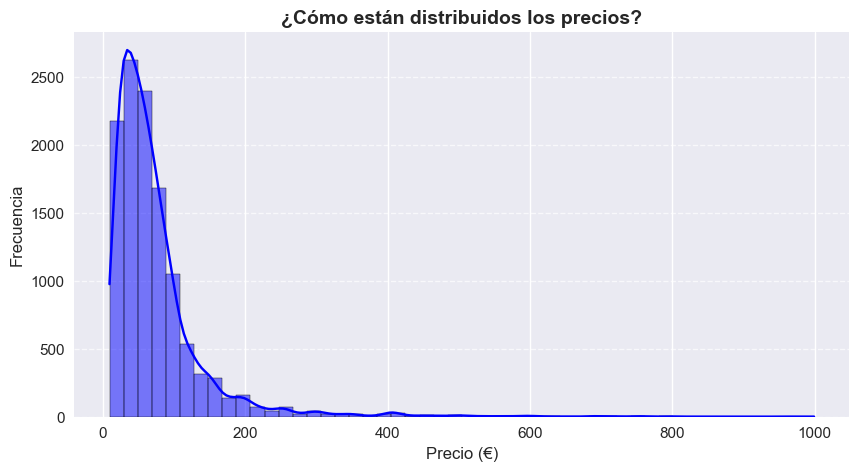

In [10]:
plt.figure(figsize=(10, 5))
sns.histplot(y_train, bins=50, kde=True, color='blue')
plt.title('¿Cómo están distribuidos los precios?', fontsize=14, fontweight='bold')
plt.xlabel('Precio (€)')
plt.ylabel('Frecuencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

## 6. Detección de Outliers con Histogramas y Boxplot

Para identificar posibles valores atípicos en los precios, se generaron varios histogramas y un diagrama de caja, complementados con el cálculo de percentiles para determinar dónde se sitúan los importes más elevados. En este análisis, el **percentil 99** se establece como límite superior para detectar outliers, ya que los precios que superan dicho umbral pueden introducir distorsiones en el modelo.


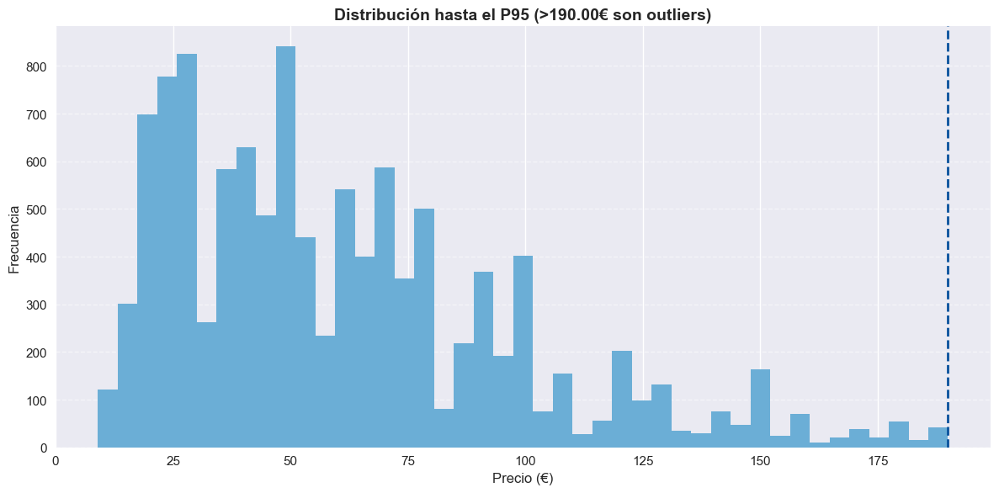

In [11]:
prices_train = y_train.dropna()
p95 = prices_train.quantile(0.95)

plt.hist(
    prices_train[prices_train <= p95],
    bins="fd",
    color="#6BAED6"
)

plt.axvline(
    p95,
    ls="--",
    color="#08519C",
    linewidth=2
)

plt.xlabel("Precio (€)")
plt.ylabel("Frecuencia")
plt.title(f"Distribución hasta el P95 (>{p95:.2f}€ son outliers)", fontsize=14, fontweight='bold')
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()

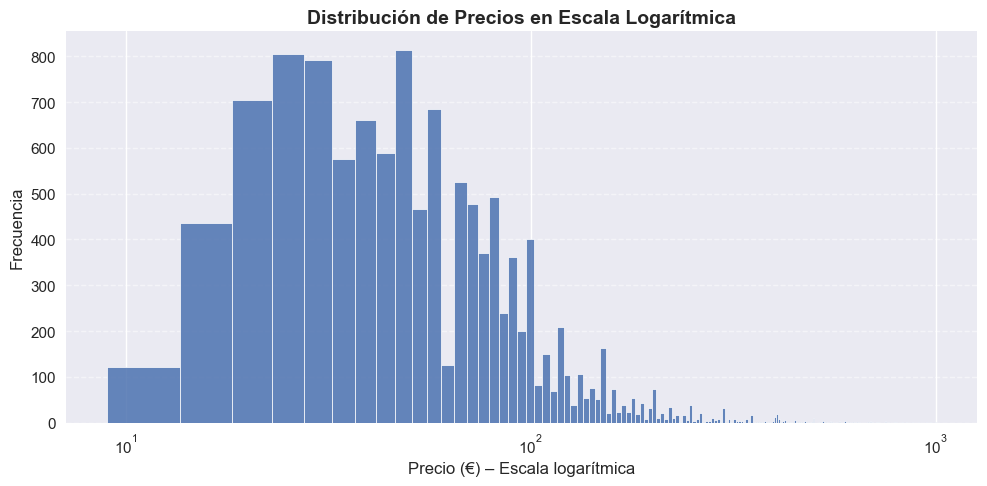

In [12]:
plt.figure(figsize=(10, 5))

plt.hist(
    y_train,  
    bins="auto",
    color="#4C72B0", 
    alpha=0.85,
    edgecolor="white",
    linewidth=0.6
)

plt.xscale("log")

plt.title("Distribución de Precios en Escala Logarítmica", fontsize=14, fontweight='bold')
plt.xlabel("Precio (€) – Escala logarítmica", fontsize=12)
plt.ylabel("Frecuencia", fontsize=12)

plt.grid(axis="y", linestyle="--", alpha=0.5)

plt.tight_layout()
plt.show()

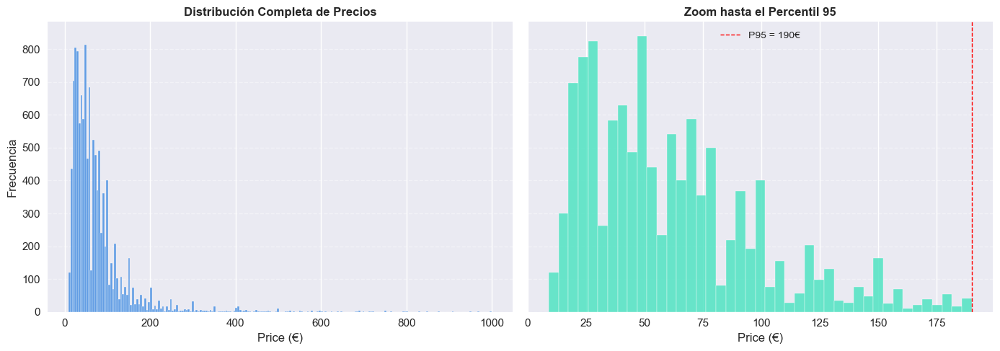

In [13]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(14, 5), sharey=True)

p95_train = y_train.quantile(0.95)

# ---- Histograma completo ----
ax1.hist(y_train, bins="fd", color="#4A90E2", edgecolor="white", alpha=0.85)
ax1.set_title("Distribución Completa de Precios", fontsize=12, weight="bold")
ax1.set_xlabel("Price (€)")
ax1.set_ylabel("Frecuencia")
ax1.grid(axis="y", linestyle="--", alpha=0.4)

# ---- Histograma acotado al P95 ----
ax2.hist(y_train[y_train <= p95_train], bins="fd", color="#50E3C2", edgecolor="white", alpha=0.85)
ax2.axvline(p95_train, color="red", linestyle="--", linewidth=1, label=f"P95 = {p95_train:.0f}€")
ax2.set_title("Zoom hasta el Percentil 95", fontsize=12, weight="bold")
ax2.set_xlabel("Price (€)")
ax2.grid(axis="y", linestyle="--", alpha=0.4)
ax2.legend(frameon=False)

plt.tight_layout()
plt.show()

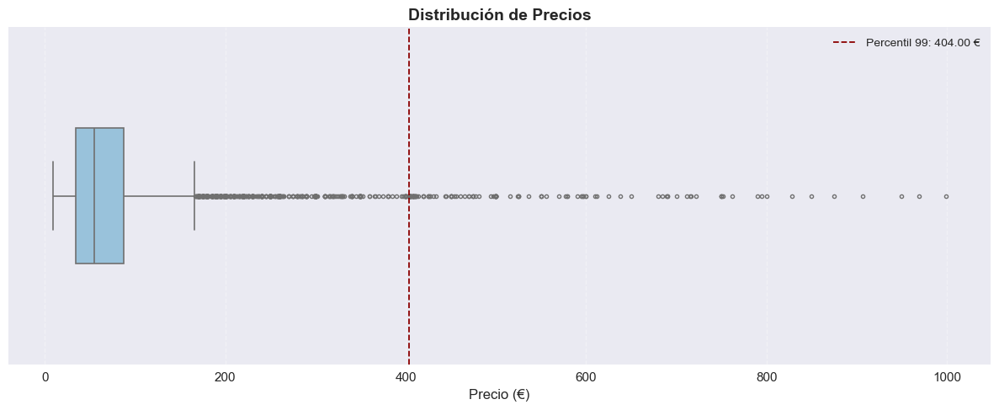


Estadístico de percentiles del precio:

P25: 34.00 €
P50 (mediana): 55.00 €
P75: 87.00 €
P90: 136.00 €
P95: 190.00 €
P99: 404.00 €


In [14]:
# --- Preparar datos de forma segura ---
precio_train = y_train.copy()

# Convertir explícitamente a numpy float
precio_train = np.array(precio_train, dtype=float)

# Eliminar NaN e infinitos si existieran
precio_train = precio_train[np.isfinite(precio_train)]

# --- Cálculo de percentiles ---
percentiles_train = np.percentile(precio_train, [25, 50, 75, 90, 95, 99])
p99_train = percentiles_train[-1]

# --- Boxplot ---
plt.figure(figsize=(12, 5))
sns.boxplot(
    x=precio_train,
    color='#8EC4E6',
    width=0.4,
    fliersize=3,
    linewidth=1.2
)

plt.axvline(
    p99_train,
    color='darkred',
    linestyle='--',
    linewidth=1.3,
    label=f'Percentil 99: {p99_train:.2f} €'
)

plt.title("Distribución de Precios", fontsize=14, fontweight='bold')
plt.xlabel("Precio (€)")
plt.legend()
plt.grid(axis='x', linestyle='--', alpha=0.35)
plt.tight_layout()
plt.show()

# --- Mostrar percentiles ---
print("\nEstadístico de percentiles del precio:\n")
for label, value in zip(
    ["P25", "P50 (mediana)", "P75", "P90", "P95", "P99"],
    percentiles_train
):
    print(f"{label}: {value:.2f} €")

## 7. Eliminación de Outliers

Para evitar que el modelo se vea distorsionado, se eliminan los precios que superan el percentil 99, equivalente a 404 €, asegurando así que los valores extremadamente altos no afecten el entrenamiento.


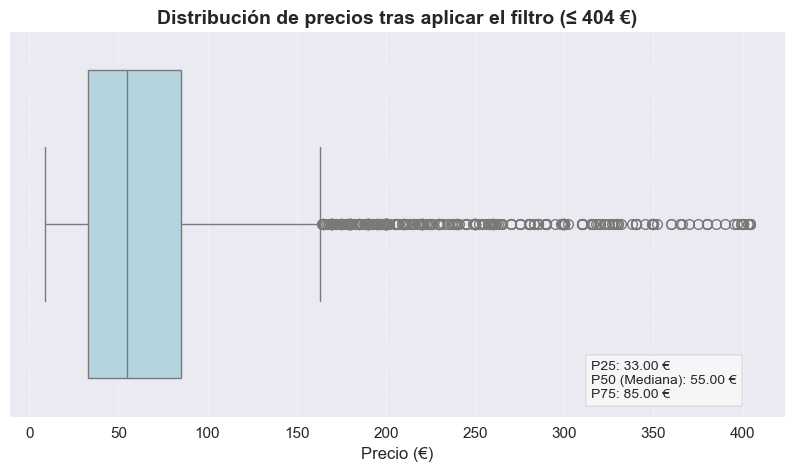

In [15]:
# Filtrar outliers 
y_train = y_train[y_train <= 404]

# Visualización mejorada
plt.figure(figsize=(10, 5))
sns.boxplot(x=y_train, color='lightblue')

plt.title('Distribución de precios tras aplicar el filtro (≤ 404 €)', fontsize=14, fontweight='bold')
plt.xlabel('Precio (€)', fontsize=12)
plt.grid(axis='x', linestyle='--', alpha=0.4)

p25, p50, p75 = np.percentile(y_train, [25, 50, 75])
plt.text(
    0.75, 0.05,  # x=0.75 (derecha), y=0.05 (abajo)
    f"P25: {p25:.2f} €\nP50 (Mediana): {p50:.2f} €\nP75: {p75:.2f} €",
    transform=plt.gca().transAxes,
    fontsize=10,
    bbox=dict(facecolor='white', alpha=0.6, edgecolor='gray') 
)
plt.show()

In [16]:
# Revisar info de X_train y y_train filtrado
print("Información de features:")
X_train.info()

print("\nInformación del target filtrado:")
y_train.describe()

Información de features:
<class 'pandas.core.frame.DataFrame'>
Index: 11824 entries, 4462 to 7270
Data columns (total 33 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Neighbourhood Cleansed          11824 non-null  object 
 1   Latitude                        11824 non-null  float64
 2   Longitude                       11824 non-null  float64
 3   Property Type                   11824 non-null  object 
 4   Room Type                       11824 non-null  object 
 5   Accommodates                    11824 non-null  int64  
 6   Bathrooms                       11778 non-null  float64
 7   Bedrooms                        11805 non-null  float64
 8   Beds                            11788 non-null  float64
 9   Bed Type                        11824 non-null  object 
 10  Amenities                       11693 non-null  object 
 11  Security Deposit                4984 non-null   float64
 12  Cleaning F

count   11,695.0000
mean        68.9283
std         53.1828
min          9.0000
25%         33.0000
50%         55.0000
75%         85.0000
max        404.0000
Name: Price, dtype: float64

## 8. Imputación de Valores Nulos en Variables Numéricas
Luego del analisis anterior para completar los valores nulos en las variables numéricas (**Bathrooms, Bedrooms, Beds y Price**) se utilizó la mediana, dado que es más robusta frente a outliers y refleja de manera más fiel el valor típico.


In [17]:
# Imputación de valores nulos (numéricas)
num_cols = ['Bathrooms', 'Bedrooms', 'Beds']

for col in num_cols:
    median_val = X_train[col].median()
    X_train[col] = X_train[col].fillna(median_val)

# Lo mismo en y_train
y_train = y_train.fillna(y_train.median())

In [18]:
# Revisar info después de imputación
print("Información de features (X_train):")
X_train.info()

print("\nInformación del target filtrado (y_train_filtered):")
y_train.describe()

Información de features (X_train):
<class 'pandas.core.frame.DataFrame'>
Index: 11824 entries, 4462 to 7270
Data columns (total 33 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Neighbourhood Cleansed          11824 non-null  object 
 1   Latitude                        11824 non-null  float64
 2   Longitude                       11824 non-null  float64
 3   Property Type                   11824 non-null  object 
 4   Room Type                       11824 non-null  object 
 5   Accommodates                    11824 non-null  int64  
 6   Bathrooms                       11824 non-null  float64
 7   Bedrooms                        11824 non-null  float64
 8   Beds                            11824 non-null  float64
 9   Bed Type                        11824 non-null  object 
 10  Amenities                       11693 non-null  object 
 11  Security Deposit                4984 non-null   float64
 12  

count   11,695.0000
mean        68.9283
std         53.1828
min          9.0000
25%         33.0000
50%         55.0000
75%         85.0000
max        404.0000
Name: Price, dtype: float64

## 9. Análisis de Security Deposit y Cleaning Fee
Las variables **Security Deposit y Cleaning Fee** contienen numerosos valores nulos, pero se estima que ambas pueden tener un impacto significativo en la precisión del modelo al predecir el precio. Antes de imputar los datos faltantes, se procederá a visualizar su distribución para determinar la estrategia de imputación más adecuada, ya sea media, mediana, cero, categórica, etc.

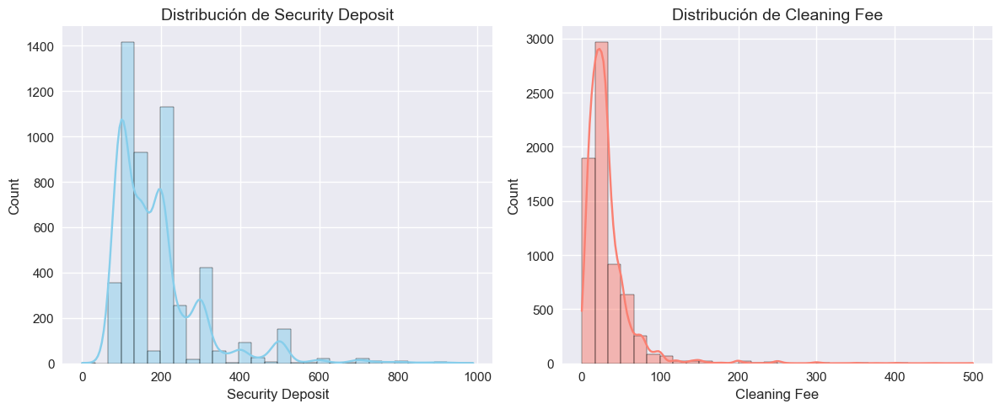

In [19]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(X_train['Security Deposit'], bins=30, kde=True, color='skyblue')
plt.title('Distribución de Security Deposit')

plt.subplot(1, 2, 2)
sns.histplot(X_train['Cleaning Fee'], bins=30, kde=True, color='salmon')
plt.title('Distribución de Cleaning Fee')

plt.tight_layout()
plt.show()

## 10.  Detección de outliers en Security Deposit y Cleaning Fee
Para identificar los outliers, generamos un **Boxplot** y calculamos los **percentiles**. 
Los valores por encima del percentil 99 serán considerados como extremos.


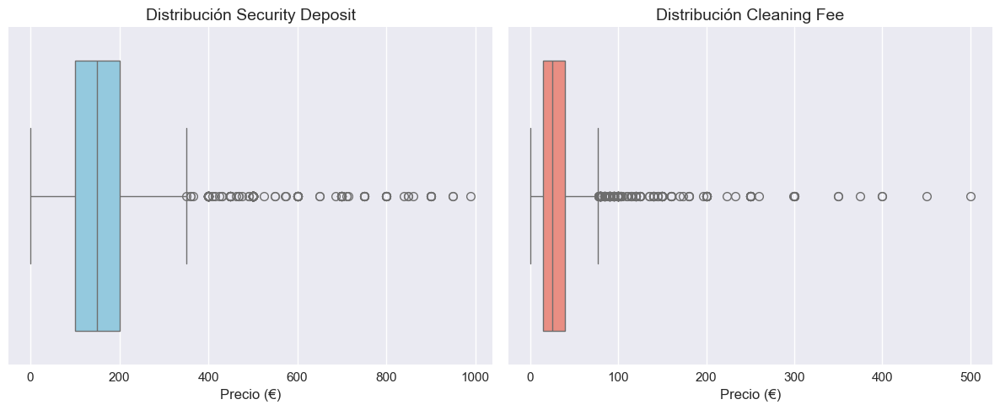

Percentiles - Security Deposit:
P25: 100.00 €
P50 (mediana): 150.00 €
P75: 200.00 €
P90: 300.00 €
P95: 450.00 €
P99: 700.00 €

Percentiles - Cleaning Fee:
P25: 15.00 €
P50 (mediana): 25.00 €
P75: 40.00 €
P90: 60.00 €
P95: 77.00 €
P99: 150.00 €


In [20]:
# --- Boxplots ---
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.boxplot(x=X_train['Security Deposit'], color='skyblue')
plt.title('Distribución Security Deposit')
plt.xlabel('Precio (€)')

plt.subplot(1, 2, 2)
sns.boxplot(x=X_train['Cleaning Fee'], color='salmon')
plt.title('Distribución Cleaning Fee')
plt.xlabel('Precio (€)')

plt.tight_layout()
plt.show()

# --- Percentiles de Security Deposit ---
print("Percentiles - Security Deposit:")
percentiles_sd = np.percentile(X_train['Security Deposit'].dropna(), [25, 50, 75, 90, 95, 99])
for label, value in zip(["P25", "P50 (mediana)", "P75", "P90", "P95", "P99"], percentiles_sd):
    print(f"{label}: {value:.2f} €")

# --- Percentiles de Cleaning Fee ---
print("\nPercentiles - Cleaning Fee:")
percentiles_cf = np.percentile(X_train['Cleaning Fee'].dropna(), [25, 50, 75, 90, 95, 99])
for label, value in zip(["P25", "P50 (mediana)", "P75", "P90", "P95", "P99"], percentiles_cf):
    print(f"{label}: {value:.2f} €")

## 11. Extracción de valores extremos con KNN
Para imputar los valores extremos se empleará un modelo de K-Neighbors Regressor, de manera que los outliers sean reemplazados por estimaciones basadas en propiedades con características similares, tales como **Bedrooms, Bathrooms, Beds, Accommodates y Price.** Se establecen como límites valores por encima de **P95** tanto para Security Deposit y Cleaning fee


In [21]:
# Features predictoras
features = ['Bedrooms', 'Bathrooms', 'Beds', 'Accommodates']

# Calcular límites automáticamente con P99
limite_sd = np.percentile(
    X_train['Security Deposit'].dropna(), 95
)

limite_cf = np.percentile(
    X_train['Cleaning Fee'].dropna(), 95
)

print(f"Límite Security Deposit (P99): {limite_sd:.2f}")
print(f"Límite Cleaning Fee (P99): {limite_cf:.2f}")


# SECURITY DEPOSIT

outliers_sd = X_train[X_train['Security Deposit'] > limite_sd]
inliers_sd = X_train[X_train['Security Deposit'] <= limite_sd]

if len(outliers_sd) > 0 and len(inliers_sd) > 0:

    X_train_sd = inliers_sd[features]
    y_train_sd = inliers_sd['Security Deposit']
    X_test_sd = outliers_sd[features]

    knn_model_sd = KNeighborsRegressor(n_neighbors=5)
    knn_model_sd.fit(X_train_sd, y_train_sd)

    y_pred_knn_sd = knn_model_sd.predict(X_test_sd)

    X_train.loc[
        X_train['Security Deposit'] > limite_sd,
        'Security Deposit'
    ] = y_pred_knn_sd

    print(f"Reemplazados {len(outliers_sd)} outliers en Security Deposit.")

else:
    print("No hay outliers en Security Deposit en train.")


# CLEANING FEE

outliers_cf = X_train[X_train['Cleaning Fee'] > limite_cf]
inliers_cf = X_train[X_train['Cleaning Fee'] <= limite_cf]

if len(outliers_cf) > 0 and len(inliers_cf) > 0:

    X_train_cf = inliers_cf[features]
    y_train_cf = inliers_cf['Cleaning Fee']
    X_test_cf = outliers_cf[features]

    knn_model_cf = KNeighborsRegressor(n_neighbors=5)
    knn_model_cf.fit(X_train_cf, y_train_cf)

    y_pred_knn_cf = knn_model_cf.predict(X_test_cf)

    X_train.loc[
        X_train['Cleaning Fee'] > limite_cf,
        'Cleaning Fee'
    ] = y_pred_knn_cf

    print(f"Reemplazados {len(outliers_cf)} outliers en Cleaning Fee.")

else:
    print("No hay outliers en Cleaning Fee en train.")

Límite Security Deposit (P99): 450.00
Límite Cleaning Fee (P99): 77.00
Reemplazados 239 outliers en Security Deposit.
Reemplazados 323 outliers en Cleaning Fee.


## 12. Extracción de valores NAN con KNN
Para completar los valores nulos en las variables Security Deposit y Cleaning Fee se empleará la misma lógica con un modelo de K-Neighbors Regressor (KNN), el cual se entrenará utilizando las características **Bedrooms, Bathrooms, Beds, Accommodates y Price.**

In [22]:
# Combinar X_train y y_train temporalmente
train_temp = X_train.copy()
train_temp['Price'] = y_train

# Features predictoras incluyendo Price
features = ['Bedrooms', 'Bathrooms', 'Beds', 'Accommodates', 'Price']

# --- SECURITY DEPOSIT ---
train_sd = train_temp[train_temp['Security Deposit'].notna()]
test_sd = train_temp[train_temp['Security Deposit'].isna()]

# Eliminar filas con NaN en features
train_sd = train_sd.dropna(subset=features)
test_sd = test_sd.dropna(subset=features)

X_train_sd = train_sd[features]
y_train_sd = train_sd['Security Deposit']
X_test_sd = test_sd[features]

if len(X_test_sd) > 0 and len(X_train_sd) > 0:
    knn_model_sd = KNeighborsRegressor(n_neighbors=5)
    knn_model_sd.fit(X_train_sd, y_train_sd)
    y_pred_sd = knn_model_sd.predict(X_test_sd)
    X_train.loc[test_sd.index, 'Security Deposit'] = y_pred_sd
    print(f"Valores NaN en Security Deposit imputados: {len(y_pred_sd)}")
else:
    print("No se pudo imputar Security Deposit.")

# --- CLEANING FEE ---
train_cf = train_temp[train_temp['Cleaning Fee'].notna()]
test_cf = train_temp[train_temp['Cleaning Fee'].isna()]

# Eliminar filas con NaN en features
train_cf = train_cf.dropna(subset=features)
test_cf = test_cf.dropna(subset=features)

X_train_cf = train_cf[features]
y_train_cf = train_cf['Cleaning Fee']
X_test_cf = test_cf[features]

if len(X_test_cf) > 0 and len(X_train_cf) > 0:
    knn_model_cf = KNeighborsRegressor(n_neighbors=5)
    knn_model_cf.fit(X_train_cf, y_train_cf)
    y_pred_cf = knn_model_cf.predict(X_test_cf)
    X_train.loc[test_cf.index, 'Cleaning Fee'] = y_pred_cf
    print(f"Valores NaN en Cleaning Fee imputados: {len(y_pred_cf)}")
else:
    print("No se pudo imputar Cleaning Fee.")

Valores NaN en Security Deposit imputados: 6738
Valores NaN en Cleaning Fee imputados: 4812


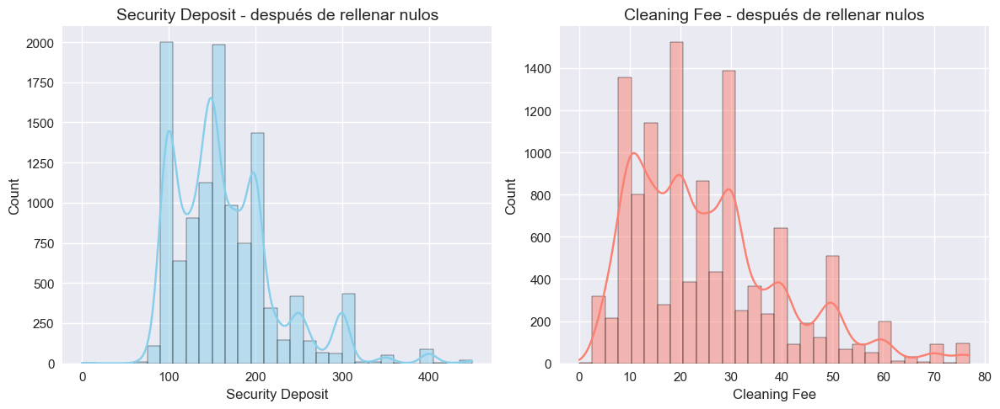

In [23]:
# Visualización de valores imputados
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
sns.histplot(X_train['Security Deposit'], bins=30, kde=True, color='skyblue')
plt.title('Security Deposit - después de rellenar nulos')

plt.subplot(1, 2, 2)
sns.histplot(X_train['Cleaning Fee'], bins=30, kde=True, color='salmon')
plt.title('Cleaning Fee - después de rellenar nulos')

plt.tight_layout()
plt.show()

In [24]:
# Revisar info de X_train y y_train
print("Información de features (X_train):")
X_train.info()

print("\nInformación del target (y_train):")
y_train.describe()

Información de features (X_train):
<class 'pandas.core.frame.DataFrame'>
Index: 11824 entries, 4462 to 7270
Data columns (total 33 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Neighbourhood Cleansed          11824 non-null  object 
 1   Latitude                        11824 non-null  float64
 2   Longitude                       11824 non-null  float64
 3   Property Type                   11824 non-null  object 
 4   Room Type                       11824 non-null  object 
 5   Accommodates                    11824 non-null  int64  
 6   Bathrooms                       11824 non-null  float64
 7   Bedrooms                        11824 non-null  float64
 8   Beds                            11824 non-null  float64
 9   Bed Type                        11824 non-null  object 
 10  Amenities                       11693 non-null  object 
 11  Security Deposit                11722 non-null  float64
 12  

count   11,695.0000
mean        68.9283
std         53.1828
min          9.0000
25%         33.0000
50%         55.0000
75%         85.0000
max        404.0000
Name: Price, dtype: float64

## 13. Imputación de Review Scores
Para las columnas de puntuaciones (Review Scores) se aplica un procedimiento diferente: se genera para cada una una columna binaria que indica si el alojamiento dispone de una valoración (1) o no (0), y los valores nulos de las columnas originales se sustituyen por -1 para identificar aquellos casos en los que aún no existen reseñas.

In [25]:
# Columnas de review
columnas_reviews = [
    'Review Scores Rating', 'Review Scores Accuracy',
    'Review Scores Cleanliness', 'Review Scores Checkin',
    'Review Scores Communication', 'Review Scores Location',
    'Review Scores Value','Reviews per Month'
]

for col in columnas_reviews:
    # Crear indicador de existencia de review
    X_train[f'Has_{col}'] = X_train[col].notna().astype(int)
    # Imputar con -1 para representar "No review"
    X_train[col] = X_train[col].fillna(-1)

# Observación rápida del df ajustado
X_train[columnas_reviews + [f'Has_{col}' for col in columnas_reviews]].head()

,Review Scores Rating,Review Scores Accuracy,Review Scores Cleanliness,Review Scores Checkin,Review Scores Communication,Review Scores Location,Review Scores Value,Reviews per Month,Has_Review Scores Rating,Has_Review Scores Accuracy,Has_Review Scores Cleanliness,Has_Review Scores Checkin,Has_Review Scores Communication,Has_Review Scores Location,Has_Review Scores Value,Has_Reviews per Month
4462,100.0000,10.0000,10.0000,10.0000,10.0000,10.0000,10.0000,0.1100,1,1,1,1,1,1,1,1
11802,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,0,0,0,0,0,0,0,0
5826,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,0,0,0,0,0,0,0,0
9745,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,-1.0000,0,0,0,0,0,0,0,0
11741,92.0000,10.0000,9.0000,10.0000,10.0000,10.0000,9.0000,1.5800,1,1,1,1,1,1,1,1


## 14. Imputación de Amenities
Para incorporar la información de las comodidades de cada alojamiento, se identifican todas las amenities y se calcula su frecuencia, se seleccionan las 20 más habituales, se generan columnas binarias que indiquen su presencia o ausencia en cada propiedad y, por último, se elimina la columna original al quedar su contenido completamente desglosado.

In [26]:
# Función para limpiar cada amenity
def limpiar_amenity(a):
    if pd.isna(a):
        return []
    s = str(a)
    s = re.sub(r'translation missing:[^,;]*', '', s, flags=re.IGNORECASE)
    parts = re.split(r',|\;|\[|\]', s)
    parts = [p.strip() for p in parts if p.strip() != ""]
    return parts

# Expandir todos los amenities de X_train en una sola lista limpia
lista_amenities = []
for x in X_train['Amenities']:
    lista_amenities.extend(limpiar_amenity(x))

# Contar frecuencia de cada amenity
amenities_counter = Counter(lista_amenities)

# Top 20 amenities más frecuentes
df_top20 = pd.DataFrame(
    amenities_counter.most_common(20),
    columns=['Amenity', 'Count']
)

df_top20

,Amenity,Count
0,Wireless Internet,11078
1,Kitchen,10891
2,Heating,10638
3,Essentials,10139
4,Washer,10013
5,TV,9267
6,Hangers,7760
7,Shampoo,7314
8,Family/kid friendly,7101
9,Elevator in building,6860


## 15. Selección de las 20 más comunes:
Las más frecuentes son seleccionadas para crear columnas binarias.  


In [27]:
# Crear columnas binarias para los top 20 amenities 

top_20_amenities = [
    'Wireless Internet', 'Kitchen', 'Heating', 'Essentials', 'Washer',
    'TV', 'Hangers', 'Shampoo', 'Family/kid friendly', 'Elevator in building',
    'Iron', 'Internet', 'Hair dryer', 'Air conditioning',
    'Laptop friendly workspace', 'Buzzer/wireless intercom', 'Smoking allowed',
    'First aid kit', '24-hour check-in', 'Dryer'
]

for amenity in top_20_amenities:
    X_train[f'Amenity_{amenity}'] = X_train['Amenities'].apply(
        lambda x: 1 if pd.notna(x) and amenity in str(x) else 0
    )

# Una vez generadas, se puede eliminar la columna original
X_train = X_train.drop(columns=['Amenities'])

for amenity in top_20_amenities:
    X_test[f'Amenity_{amenity}'] = X_test['Amenities'].apply(
        lambda x: 1 if pd.notna(x) and amenity in str(x) else 0
    )
X_test = X_test.drop(columns=['Amenities'])

In [28]:
# Revisar info de X_train y y_train
print("Información de features (X_train):")
X_train.info()

print("\nInformación del target (y_train):")
y_train.describe()

Información de features (X_train):
<class 'pandas.core.frame.DataFrame'>
Index: 11824 entries, 4462 to 7270
Data columns (total 60 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Neighbourhood Cleansed             11824 non-null  object 
 1   Latitude                           11824 non-null  float64
 2   Longitude                          11824 non-null  float64
 3   Property Type                      11824 non-null  object 
 4   Room Type                          11824 non-null  object 
 5   Accommodates                       11824 non-null  int64  
 6   Bathrooms                          11824 non-null  float64
 7   Bedrooms                           11824 non-null  float64
 8   Beds                               11824 non-null  float64
 9   Bed Type                           11824 non-null  object 
 10  Security Deposit                   11722 non-null  float64
 11  Cleaning Fee          

count   11,695.0000
mean        68.9283
std         53.1828
min          9.0000
25%         33.0000
50%         55.0000
75%         85.0000
max        404.0000
Name: Price, dtype: float64

## 16. Codificación de Variables Categóricas

Para permitir que el modelo de Machine Learning procese las variables categóricas, se aplica One-Hot Encoding. Este procedimiento convierte cada categoría en una columna binaria que señala su presencia con 1 y su ausencia con 0.

In [29]:
# Columnas categóricas a codificar
columnas_categoricas = ['Property Type', 'Room Type', 'Bed Type', 'Cancellation Policy']

for col in columnas_categoricas:
    print(f"\nCategorías en '{col}':")
    display(X_train[col].value_counts())


Categorías en 'Property Type':


Property Type
Apartment             9577
House                 1092
Condominium            298
Bed & Breakfast        281
Loft                   238
Other                  174
Dorm                    37
Guesthouse              32
Chalet                  23
Townhouse               14
Hostel                  14
Villa                   12
Serviced apartment      11
Boutique hotel           4
Camper/RV                4
Casa particular          3
Earth House              3
Boat                     2
Guest suite              2
Tent                     1
Timeshare                1
Bungalow                 1
Name: count, dtype: int64


Categorías en 'Room Type':


Room Type
Entire home/apt    7166
Private room       4476
Shared room         182
Name: count, dtype: int64


Categorías en 'Bed Type':


Bed Type
Real Bed         11568
Pull-out Sofa      207
Futon               31
Couch               15
Airbed               3
Name: count, dtype: int64


Categorías en 'Cancellation Policy':


Cancellation Policy
strict             4606
flexible           3728
moderate           3388
super_strict_60      30
strict_new           24
moderate_new         19
super_strict_30      16
flexible_new         13
Name: count, dtype: int64

## 17. Categorización con One-Hot Encoding
Se utiliza **OneHotEncoder**, que genera columnas binarias para cada categoría y, para evitar multicolinealidad, elimina la primera categoría (drop='first'); el resultado es un conjunto de nuevas variables que indican si cada registro pertenece a una categoría específica.


In [30]:
from sklearn.preprocessing import OneHotEncoder

# Columnas categóricas a codificar
cols_to_encode = ['Property Type', 'Room Type', 'Bed Type', 'Cancellation Policy']

# Inicializar el encoder con drop='first' para evitar multicolinealidad
encoder = OneHotEncoder(sparse_output=False, drop='first')

# Fit y transform solo sobre X_train
encoded_train = encoder.fit_transform(X_train[cols_to_encode])
encoded_cols = encoder.get_feature_names_out(cols_to_encode)
encoded_train_df = pd.DataFrame(encoded_train, columns=encoded_cols, index=X_train.index)

# Reemplazar las columnas originales en X_train
X_train = pd.concat([X_train.drop(columns=cols_to_encode), encoded_train_df], axis=1)

# Comprobación
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11824 entries, 4462 to 7270
Data columns (total 90 columns):
 #   Column                               Non-Null Count  Dtype  
---  ------                               --------------  -----  
 0   Neighbourhood Cleansed               11824 non-null  object 
 1   Latitude                             11824 non-null  float64
 2   Longitude                            11824 non-null  float64
 3   Accommodates                         11824 non-null  int64  
 4   Bathrooms                            11824 non-null  float64
 5   Bedrooms                             11824 non-null  float64
 6   Beds                                 11824 non-null  float64
 7   Security Deposit                     11722 non-null  float64
 8   Cleaning Fee                         11746 non-null  float64
 9   Guests Included                      11824 non-null  int64  
 10  Extra People                         11824 non-null  int64  
 11  Minimum Nights                 

## 18. Revisión y manejo de la variable Features
La variable **Features** contiene información sobre el alojamiento y el anfitrión, como si el host es superhost, tiene foto de perfil, identidad verificada, si la ubicación es exacta, si se requiere licencia o si se puede reservar al instante; cada registro es una lista de estas características separadas por comas, y nos indica atributos del listing que podrían influir en el precio o en la elección del huésped.

In [31]:
pd.set_option('display.max_colwidth', None)  # Mostrar texto completo
X_train["Features"].head(20)

4462                                                                                            Host Has Profile Pic,Is Location Exact,Requires License
11802                                                                     Host Has Profile Pic,Host Identity Verified,Requires License,Instant Bookable
5826                                                                                      Host Has Profile Pic,Host Identity Verified,Is Location Exact
9745                                                                     Host Has Profile Pic,Host Identity Verified,Is Location Exact,Requires License
11741                                                                                           Host Has Profile Pic,Is Location Exact,Requires License
2507                                                                     Host Has Profile Pic,Host Identity Verified,Is Location Exact,Requires License
3207                                                                      Host Has Profi

In [32]:
# Manejo de variable Features 
all_features = ','.join(X_train['Features'].dropna()).split(',')
features_counter = Counter([feature.strip() for feature in all_features])
pd.DataFrame(features_counter.most_common(20), columns=['Feature', 'Count'])

,Feature,Count
0,Host Has Profile Pic,11783
1,Requires License,11222
2,Is Location Exact,7701
3,Host Identity Verified,6915
4,Instant Bookable,4303
5,Host Is Superhost,1351
6,Require Guest Phone Verification,475
7,Require Guest Profile Picture,226


In [33]:
# Codificación de Features 
features_to_encode = [
    'Requires License', 'Host Has Profile Pic', 'Is Location Exact',
    'Host Identity Verified', 'Instant Bookable', 'Host Is Superhost',
    'Require Guest Phone Verification', 'Require Guest Profile Picture'
]

for feature in features_to_encode:
    X_train[f'Feature_{feature}'] = X_train['Features'].apply(
        lambda x: 1 if pd.notna(x) and feature in x else 0
    )

# Eliminar columna original
X_train = X_train.drop(columns=['Features'])

# Verificación
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Index: 11824 entries, 4462 to 7270
Data columns (total 97 columns):
 #   Column                                    Non-Null Count  Dtype  
---  ------                                    --------------  -----  
 0   Neighbourhood Cleansed                    11824 non-null  object 
 1   Latitude                                  11824 non-null  float64
 2   Longitude                                 11824 non-null  float64
 3   Accommodates                              11824 non-null  int64  
 4   Bathrooms                                 11824 non-null  float64
 5   Bedrooms                                  11824 non-null  float64
 6   Beds                                      11824 non-null  float64
 7   Security Deposit                          11722 non-null  float64
 8   Cleaning Fee                              11746 non-null  float64
 9   Guests Included                           11824 non-null  int64  
 10  Extra People                         

## 19. Revisión y manejo de variables relacionadas a la ubicación (Latitude, Longitude, Neighbourhood Cleansed)¶
Estas variables aportan al modelo información sobre la ubicación de cada alojamiento. 
Se conservarán todos los registros del dataset, sin filtrar por Madrid, para que el modelo aprenda patrones de precio basados en todas las zonas. 
Se realizará imputación de coordenadas faltantes y codificación de los barrios más frecuentes.

In [34]:
# Variables de interés
loc_cols = ['Latitude', 'Longitude', 'Neighbourhood Cleansed']

# --- 1. Imputar lat/lon faltantes con mediana  ---
lat_median = X_train['Latitude'].median()
lon_median = X_train['Longitude'].median()

X_train['Latitude'] = X_train['Latitude'].fillna(lat_median)
X_train['Longitude'] = X_train['Longitude'].fillna(lon_median)

X_test['Latitude'] = X_test['Latitude'].fillna(lat_median)
X_test['Longitude'] = X_test['Longitude'].fillna(lon_median)

# --- 2. Identificar barrios más frecuentes  ---
top_n = 20
top_neighbourhoods = X_train['Neighbourhood Cleansed'].value_counts().head(top_n).index.tolist()

# --- 3. Función de codificación de barrios (One-Hot Encoding) ---
def encode_neighbourhood(df, top_list):
    df = df.copy()
    # Crear columna temporal para barrios no frecuentes
    df['Neighbourhood_Cleansed_mod'] = df['Neighbourhood Cleansed'].apply(
        lambda x: x if x in top_list else 'Other'
    )
    # One-Hot Encoding
    ohe = pd.get_dummies(df['Neighbourhood_Cleansed_mod'], prefix='Neighbourhood', drop_first=True)
    df = pd.concat([df.drop(columns=['Neighbourhood_Cleansed_mod']), ohe], axis=1)
    return df

# --- 4. Aplicar a X_train ---
X_train_encoded = encode_neighbourhood(X_train, top_neighbourhoods)

# --- 5. Aplicar a X_test ---
def encode_neighbourhood_test(df, top_list, train_cols):
    df = df.copy()
    df['Neighbourhood_Cleansed_mod'] = df['Neighbourhood Cleansed'].apply(
        lambda x: x if x in top_list else 'Other'
    )
    ohe = pd.get_dummies(df['Neighbourhood_Cleansed_mod'], prefix='Neighbourhood', drop_first=True)
    
    # Alinear columnas con X_train
    for col in train_cols:
        if col not in ohe.columns:
            ohe[col] = 0
    ohe = ohe[train_cols]
    
    df = pd.concat([df.drop(columns=['Neighbourhood_Cleansed_mod']), ohe], axis=1)
    return df

train_neighbourhood_cols = [c for c in X_train_encoded.columns if c.startswith('Neighbourhood_')]
X_test_encoded = encode_neighbourhood_test(X_test, top_neighbourhoods, train_neighbourhood_cols)

# --- 6. Mantener columna original para visualizaciones ---
# Nota: no se elimina 'Neighbourhood Cleansed' de X_train ni X_test
X_train_encoded['Neighbourhood Cleansed'] = X_train['Neighbourhood Cleansed']
X_test_encoded['Neighbourhood Cleansed'] = X_test['Neighbourhood Cleansed']

# --- 7. Verificación final ---
print("X_train info:")
X_train_encoded.info()
print("\nX_test info:")
X_test_encoded.info()

X_train info:
<class 'pandas.core.frame.DataFrame'>
Index: 11824 entries, 4462 to 7270
Columns: 117 entries, Neighbourhood Cleansed to Neighbourhood_Universidad
dtypes: bool(20), float64(50), int64(46), object(1)
memory usage: 9.3+ MB

X_test info:
<class 'pandas.core.frame.DataFrame'>
Index: 2956 entries, 10387 to 7802
Data columns (total 72 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Neighbourhood Cleansed             2956 non-null   object 
 1   Latitude                           2956 non-null   float64
 2   Longitude                          2956 non-null   float64
 3   Property Type                      2956 non-null   object 
 4   Room Type                          2956 non-null   object 
 5   Accommodates                       2956 non-null   int64  
 6   Bathrooms                          2947 non-null   float64
 7   Bedrooms                           2950 non-null   float64
 8   

In [35]:
import folium
from folium.plugins import MarkerCluster

center_lat = X_train['Latitude'].mean()
center_lon = X_train['Longitude'].mean()

mapa = folium.Map(location=[center_lat, center_lon], zoom_start=5, tiles="CartoDB positron")
cluster = MarkerCluster().add_to(mapa)

for lat, lon in X_train[['Latitude','Longitude']].values:
    folium.Marker(
        location=[lat, lon],
        icon=folium.Icon(color="blue", icon="home", prefix="fa")
    ).add_to(cluster)

mapa

In [36]:
# Calcular mediana por barrio 

train_temp = X_train.copy()
train_temp['Price'] = y_train

medianas = train_temp.groupby('Neighbourhood Cleansed')['Price'].median()

# Crear neigh_med

X_train['neigh_med'] = X_train['Neighbourhood Cleansed'].map(medianas)
X_test['neigh_med'] = X_test['Neighbourhood Cleansed'].map(medianas)

# Si algún barrio no existe
global_median = y_train.median()
X_test['neigh_med'] = X_test['neigh_med'].fillna(global_median)

# 3️ Crear grupos SOLO usando train

X_train['neigh_group'] = pd.qcut(
    X_train['neigh_med'],
    q=3,
    labels=['económico', 'estandar', 'costoso']
)

# Guardar bins aprendidos
bins = pd.qcut(X_train['neigh_med'], q=3, retbins=True)[1]

# Aplicar mismos bins a test
X_test['neigh_group'] = pd.cut(
    X_test['neigh_med'],
    bins=bins,
    labels=['económico', 'estandar', 'costoso'],
    include_lowest=True
)

# 4️ Dummies

X_train = pd.get_dummies(X_train, columns=['neigh_group'], prefix='neigh')
X_test = pd.get_dummies(X_test, columns=['neigh_group'], prefix='neigh')

# Alinear columnas
X_test = X_test.reindex(columns=X_train.columns, fill_value=0)

# 5️ Eliminar columnas originales

cols_drop = ["Neighbourhood Cleansed", "Latitude", "Longitude", "neigh_med"]
X_train = X_train.drop(columns=cols_drop)
X_test = X_test.drop(columns=cols_drop)

In [37]:
# Por último se usa VIF (variance inflation factor) sobre las siguientes variables para conocer su colinealidad
variables_vif = ['Bedrooms', 'Beds', 'Accommodates', 'Guests Included', 'Bathrooms']

X_vif = X_train[variables_vif].copy().fillna(0)

vif_data = pd.DataFrame()
vif_data['Variable'] = X_vif.columns
vif_data['VIF'] = [
    variance_inflation_factor(X_vif.values, i)
    for i in range(X_vif.shape[1])
]

print(vif_data.sort_values(by='VIF', ascending=False))

          Variable     VIF
2     Accommodates 13.4032
1             Beds  9.5735
0         Bedrooms  8.3953
4        Bathrooms  4.7333
3  Guests Included  4.0192


In [38]:
# Se eliminan las siguientes variables por alta colinealidad, Accommodates captura la información principal de capacidad
cols_to_drop = ['Bedrooms', 'Beds', 'Guests Included', 'Bathrooms']

X_train = X_train.drop(columns=cols_to_drop)
X_test = X_test.drop(columns=cols_to_drop)

## 20. Preparación de X_test y selección final de variables 
En este bloque se procesa el dataset **X_test** crudo para preparlo antes del modelado con los valores obtenidos de **X_train**, así como, la selcción final de variables.


In [39]:
# ==========================================
# PIPELINE FINAL DE AJUSTE TRAIN / TEST
# ==========================================

# -------------------------------
# Eliminar filas de X_train / y_train con NaN en y_train
# -------------------------------
valid_train_idx = y_train.dropna().index
X_train = X_train.loc[valid_train_idx].copy()
y_train = y_train.loc[valid_train_idx].copy()

# -------------------------------
# Eliminar filas de X_test / y_test con NaN en y_test
# -------------------------------
valid_test_idx = y_test.dropna().index
X_test = X_test.loc[valid_test_idx].copy()
y_test = y_test.loc[valid_test_idx].copy()

# -------------------------------
# Imputación numérica en X_test usando estadísticas de X_train
# -------------------------------
numeric_cols_with_nan = [
    'Security Deposit', 'Cleaning Fee',
    'Review Scores Rating', 'Review Scores Accuracy',
    'Review Scores Cleanliness', 'Review Scores Checkin',
    'Review Scores Communication', 'Review Scores Location',
    'Review Scores Value', 'Reviews per Month'
]

for col in numeric_cols_with_nan:
    if col in X_test.columns:
        median_value = X_train[col].median()
        X_test[col] = X_test[col].fillna(median_value)

# -------------------------------
# Asegurar mismas columnas en X_test
# -------------------------------
train_cols = X_train.columns

# Crear columnas faltantes en test
for col in train_cols:
    if col not in X_test.columns:
        X_test[col] = 0

# Reordenar columnas
X_test = X_test[train_cols]

# -------------------------------
#  Igualar tipos de datos
# -------------------------------
for col in train_cols:
    X_test[col] = X_test[col].astype(X_train[col].dtype)

# -------------------------------
# FASE FINAL: Eliminación total de NaN (train y test)
# -------------------------------
for col in X_train.columns:
    if X_train[col].isna().sum() > 0 or X_test[col].isna().sum() > 0:
        if X_train[col].dtype in ['float64', 'int64']:
            fill_value = X_train[col].median()
        elif X_train[col].dtype == 'bool':
            fill_value = False
        else:
            fill_value = 0
        X_train[col] = X_train[col].fillna(fill_value)
        X_test[col]  = X_test[col].fillna(fill_value)

# -------------------------------
# VERIFICACIÓN FINAL DE FEATURES
# -------------------------------
print("====== VERIFICACIÓN FEATURES ======")
print("Shape X_train:", X_train.shape)
print("Shape X_test :", X_test.shape)
print("\nNaN finales en X_train:", X_train.isna().sum().sum())
print("NaN finales en X_test :", X_test.isna().sum().sum())
print("\nDistribución tipos X_train:")
print(X_train.dtypes.value_counts())
print("\nDistribución tipos X_test:")
print(X_test.dtypes.value_counts())
print("\nColumnas idénticas:", list(X_train.columns) == list(X_test.columns))

# -------------------------------
# VERIFICACIÓN DE LA VARIABLE OBJETIVO
# -------------------------------
print("\n====== VERIFICACIÓN VARIABLE OBJETIVO ======")
print("Shape y_train:", y_train.shape)
print("Shape y_test :", y_test.shape)
print("\nNulos en y_train:", y_train.isna().sum())
print("Nulos en y_test :", y_test.isna().sum())
print("\nTipo de dato y_train:", y_train.dtype)
print("Tipo de dato y_test :", y_test.dtype)

====== VERIFICACIÓN FEATURES ======
Shape X_train: (11695, 93)
Shape X_test : (2951, 93)

NaN finales en X_train: 0
NaN finales en X_test : 0

Distribución tipos X_train:
int64      45
float64    45
bool        3
Name: count, dtype: int64

Distribución tipos X_test:
int64      45
float64    45
bool        3
Name: count, dtype: int64

Columnas idénticas: True

====== VERIFICACIÓN VARIABLE OBJETIVO ======
Shape y_train: (11695,)
Shape y_test : (2951,)

Nulos en y_train: 0
Nulos en y_test : 0

Tipo de dato y_train: float64
Tipo de dato y_test : float64


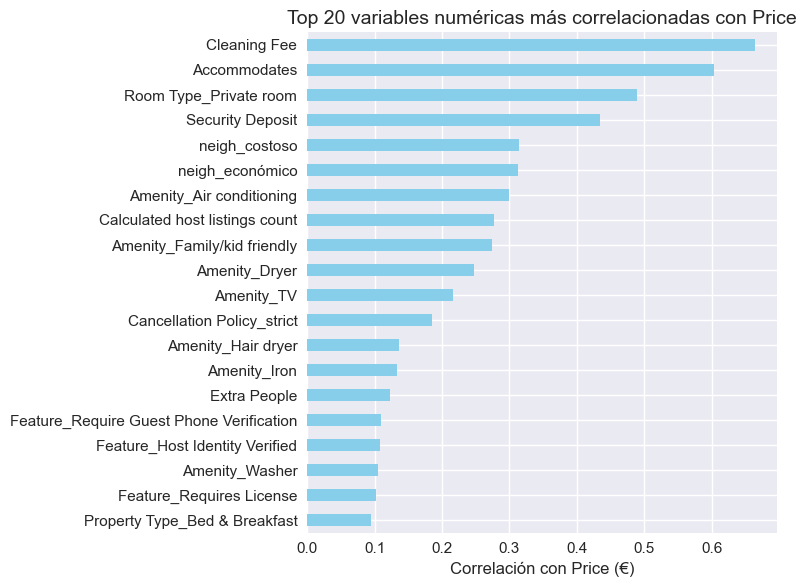

In [41]:
# Selección del top 20 variables 

# Seleccionar solo columnas numéricas de X_train 
X_numeric = X_train.select_dtypes(include=['float64', 'int64', 'bool'])

# Convertir columnas booleanas a int para evitar problemas con el modelado
bool_cols = X_numeric.select_dtypes(include=['bool']).columns
X_numeric[bool_cols] = X_numeric[bool_cols].astype(int)

# Escalado de variables numéricas 
scaler = StandardScaler()
X_scaled = pd.DataFrame(scaler.fit_transform(X_numeric), columns=X_numeric.columns, index=X_numeric.index)

# Correlación absoluta con y_train 
corr_with_target = X_scaled.corrwith(y_train).abs()

# Ordenar y seleccionar top 20
corr_sorted = corr_with_target.sort_values(ascending=False)
top20 = corr_sorted.head(20)

# Visualizar 
plt.figure(figsize=(8,6))
top20.plot(kind='barh', color='skyblue')
plt.gca().invert_yaxis()
plt.xlabel('Correlación con Price (€)')
plt.title('Top 20 variables numéricas más correlacionadas con Price')
plt.tight_layout()
plt.show()

---

## 21. Pruebas con MLflow
Entrenamiento y logging en MLflow de todos los modelos

In [48]:
# Opcional para llevar un control de metricas y parametros

"""
import mlflow
import mlflow.sklearn
from sklearn.linear_model import LinearRegression
import xgboost as xgb
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# =============================
# CONFIGURACIÓN GENERAL
# =============================
models = {
    "LinearRegression": LinearRegression(),
    "XGBoost": xgb.XGBRegressor(n_estimators=100, random_state=42, eval_metric='rmse')
}

mlflow.set_experiment("Airbnb_Price_Prediction")

# =============================
# PIPELINE MLflow 
# =============================

top_features = top20.index 

# Selección de columnas
X_train_top = X_train[top_features]
X_test_top  = X_test[top_features]

for model_name, model in models.items():
    run_name = f"{model_name}_Top20"
    with mlflow.start_run(run_name=run_name):
        # Entrenamiento
        model.fit(X_train_top, y_train)

        # Predicción
        y_pred = model.predict(X_test_top)

        # Métricas
        mae  = mean_absolute_error(y_test, y_pred)
        rmse = np.sqrt(mean_squared_error(y_test, y_pred))
        r2   = r2_score(y_test, y_pred)

        # Registrar métricas en MLflow
        mlflow.log_metric("MAE", mae)
        mlflow.log_metric("RMSE", rmse)
        mlflow.log_metric("R2", r2)

        # Registrar parámetros y tags
        mlflow.log_param("n_features", len(top_features))
        mlflow.log_param("features_used", list(top_features))
        mlflow.set_tag("feature_selection", "Top20")
        mlflow.set_tag("scaler", "pipeline_preprocessed")
        mlflow.set_tag("split_random_state", 42)

        # Guardar modelo
        mlflow.sklearn.log_model(model, name="model")

        # Resumen en consola
        print(f"Run registrado: {run_name}")
        print(f"MAE: {mae:.2f} | RMSE: {rmse:.2f} | R2: {r2:.4f}\n")
"""

'\nimport mlflow\nimport mlflow.sklearn\nfrom sklearn.linear_model import LinearRegression\nfrom sklearn.ensemble import RandomForestRegressor\nimport xgboost as xgb\nfrom sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score\nimport numpy as np\n\n# =============================\n# CONFIGURACIÓN GENERAL\n# =============================\nmodels = {\n    "LinearRegression": LinearRegression(),\n    "RandomForest": RandomForestRegressor(n_estimators=100, random_state=42),\n    "XGBoost": xgb.XGBRegressor(n_estimators=100, random_state=42, eval_metric=\'rmse\')\n}\n\nmlflow.set_experiment("Airbnb_Price_Prediction")\n\n# =============================\n# PIPELINE MLflow \n# =============================\n\ntop_features = top20.index \n\n# Selección de columnas\nX_train_top = X_train[top_features]\nX_test_top  = X_test[top_features]\n\nfor model_name, model in models.items():\n    run_name = f"{model_name}_Top20"\n    with mlflow.start_run(run_name=run_name):\n        # En

---

## 22.1 Entrenamiento con Regresión Lineal
Para un primer acercamiento, utilizamos un modelo de **Regresión Lineal** con el objetivo de estimar el `Price` a partir de las variables predictoras seleccionadas.

### Pasos realizados:
1. Inicialización del modelo y escalado de las variables numéricas.  
2. Selección de las variables.  
3. Entrenamiento del modelo con el conjunto de entrenamiento (`X_train`, `y_train`).  
4. Predicción en el conjunto de prueba (`X_test`).  
5. Evaluación del modelo mediante métricas de error:  
   - **MAE** → Mean Absolute Error  
   - **MSE** → Mean Squared Error  
   - **RMSE** → Root Mean Squared Error  
   - **R2** → Coeficiente de determinación  

### Visualización del rendimiento:
Se generaron gráficos de dispersión donde:  
- Los puntos azules representan las predicciones del modelo.  
- La línea roja discontinua indica el comportamiento ideal, donde predicción y valor real coinciden exactamente. 

In [42]:
# -------------------------------
# 1️⃣ Selección de las variables Top 20
# -------------------------------
X_train_top20 = X_train[top20.index]
X_test_top20  = X_test[top20.index]

# -------------------------------
# 2️⃣ Entrenamiento del modelo
# -------------------------------
model = LinearRegression()
model.fit(X_train_top20, y_train)

# -------------------------------
# 3️⃣ Predicción sobre test
# -------------------------------
y_pred = model.predict(X_test_top20)

# -------------------------------
# 4️⃣ Cálculo de métricas
# -------------------------------
mae  = mean_absolute_error(y_test, y_pred)
mse  = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
r2   = r2_score(y_test, y_pred)

# -------------------------------
# 5️⃣ Resultados
# -------------------------------
print("----- TOP 20 -----")
print(f"Mean Absolute Error (MAE)   : {mae:.2f}")
print(f"Mean Squared Error (MSE)    : {mse:.2f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.2f}")
print(f"R-squared (R2)              : {r2:.4f}")

----- TOP 20 -----
Mean Absolute Error (MAE)   : 34.69
Mean Squared Error (MSE)    : 3431.80
Root Mean Squared Error (RMSE): 58.58
R-squared (R2)              : 0.3242


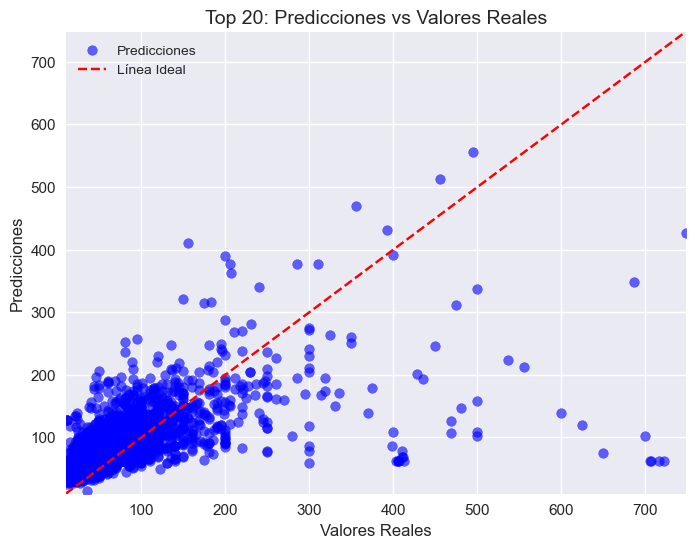

In [43]:
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, color='blue', alpha=0.6, label='Predicciones')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', linestyle='--', label='Línea Ideal')
plt.title('Top 20: Predicciones vs Valores Reales')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.xlim(y_test.min(), y_test.max())
plt.ylim(y_test.min(), y_test.max())
plt.legend()
plt.grid(True)
plt.show()

### Interpretación de los gráficos
Los resultados muestran que ambos modelos ajustan bastante bien los precios:  

- **MAE** y **RMSE** indican que, en promedio, las predicciones se desvían entre **14 y 22 unidades** del precio real.  
- **MSE** refleja el **error cuadrático medio**, que es mayor para **Top 20**, mostrando más variación en los errores grandes.  
- **R²** cercano a **0.74** indica que alrededor del **74% de la variabilidad del precio** se explica por las variables seleccionadas.  

Comparando ambos modelos, usar **50 variables** mejora ligeramente el ajuste frente a **20 variables**, aunque la diferencia no es muy grande, lo que sugiere que las **20 variables más correlacionadas** ya capturan la mayor parte de la información relevante.

----

## 22.2 Entrenamiento con XGBooting

In [44]:
# !pip install xgboost  # Instalar si no está en el sistema
from xgboost import XGBRegressor

def train_xgboost_top20(X_train, X_test, y_train, y_test,
                        n_estimators=200, max_depth=6, learning_rate=0.1,
                        random_state=42):
    
    # -------------------------------
    # Selección Top 20 por correlación (solo en train)
    # -------------------------------
    corr_with_target = X_train.corrwith(y_train).abs()
    top_20_features = corr_with_target.sort_values(ascending=False).head(20).index.tolist()
    
    X_train_sub = X_train[top_20_features]
    X_test_sub = X_test[top_20_features]
    
    # -------------------------------
    # Modelo
    # -------------------------------
    model = XGBRegressor(
        n_estimators=n_estimators,
        max_depth=max_depth,
        learning_rate=learning_rate,
        random_state=random_state,
        verbosity=0
    )
    
    # Entrenamiento
    model.fit(X_train_sub, y_train)
    
    # Predicción
    y_pred = model.predict(X_test_sub)
    
    # Métricas
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    # Resultado
    results = pd.DataFrame({
        'MAE': [mae],
        'MSE': [mse],
        'RMSE': [rmse],
        'R2': [r2]
    }, index=['Top 20'])
    
    print("📊 Resultados XGBoost - Top 20")
    print(results)
    
    return {
        'model': model,
        'top_features': top_20_features,
        'MAE': mae,
        'MSE': mse,
        'RMSE': rmse,
        'R2': r2,
        'y_test': y_test,
        'y_pred': y_pred
    }


# -------------------------------
# Ejecutar entrenamiento
# -------------------------------
xgb_result_20 = train_xgboost_top20(X_train, X_test, y_train, y_test)

📊 Resultados XGBoost - Top 20
           MAE        MSE    RMSE     R2
Top 20 30.8527 3,520.6072 59.3347 0.3067


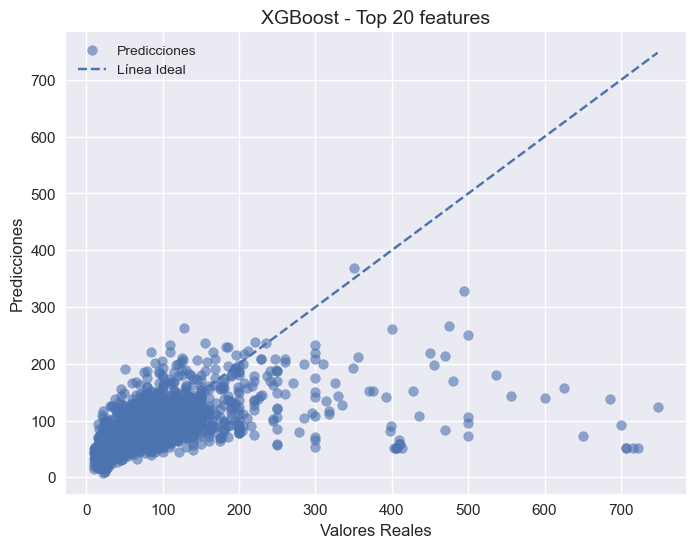

In [45]:
import matplotlib.pyplot as plt

# -------------------------------
# Gráfico Predicciones vs Reales - Top 20
# -------------------------------
plt.figure(figsize=(8,6))

plt.scatter(
    xgb_result_20['y_test'],
    xgb_result_20['y_pred'],
    alpha=0.6,
    label='Predicciones'
)

plt.plot(
    [xgb_result_20['y_test'].min(), xgb_result_20['y_test'].max()],
    [xgb_result_20['y_test'].min(), xgb_result_20['y_test'].max()],
    linestyle='--',
    label='Línea Ideal'
)

plt.title('XGBoost - Top 20 features')
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.legend()
plt.grid(True)

plt.show()

### Interpretación de los gráficos 

Los resultados obtenidos muestran que XGBoost ofrece un **rendimiento sólido** para la predicción de precios, con métricas en general mejores que las obtenidas con el modelo lineal y comparables o superiores al Random Forest:

- Tanto el **MAE** como el **RMSE** son bajos, indicando errores promedio moderados y una buena estabilidad del modelo.
- El **R²** alcanza valores superiores al **83%**, lo que significa que el modelo explica una gran parte de la variabilidad del precio.
- Utilizar **Top 50** variables mejora de forma consistente el desempeño frente a **Top 20**, especialmente en **MSE**, **RMSE** y **R²**, lo que indica que XGBoost aprovecha eficientemente más información del dataset.

En conjunto, XGBoost muestra un comportamiento más robusto y ajusta mejor los datos cuando se trabaja con un mayor número de variables relevantes.


---

## 23. Evaluación de cada modelo
Aquí ya la idea es sencillamente ver de manera visual y clara que modelo se desempeño mejor de los tres modelos usados (regresión lineal, ramdon forest y XGboost) es un resumen de la interpretación de cada gráfico anterior, la diferencia es que aquí se tomo solo los datos de las métricas de los modelos que tuvieron **cincuenta variables** ya que demostro ligeramente tener mejor rendimiento.

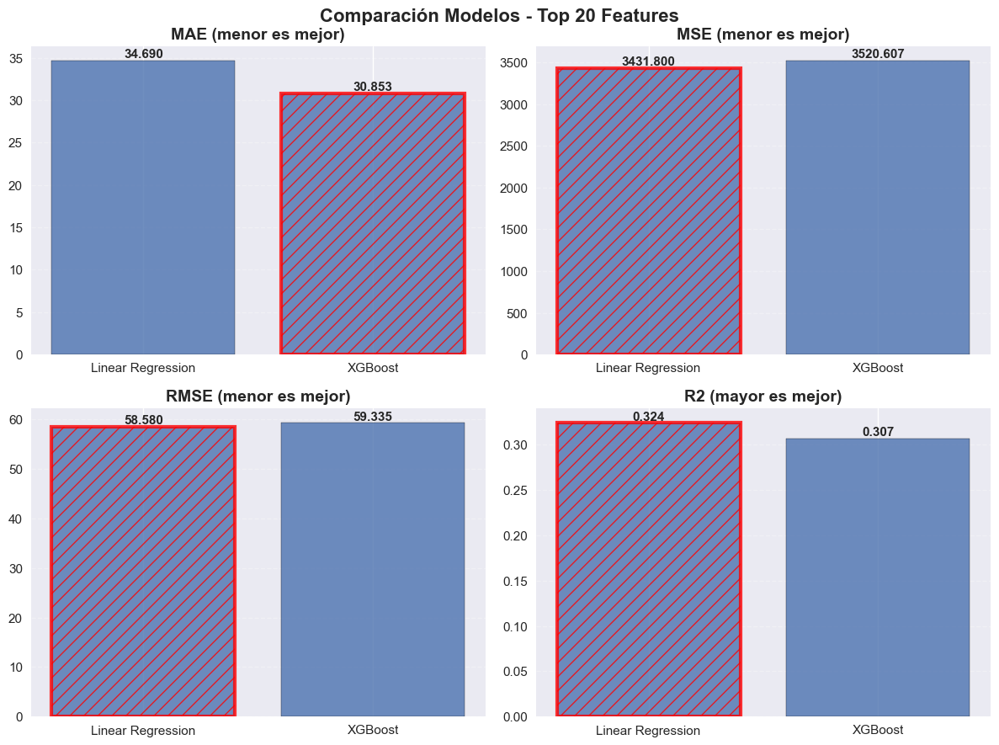

Resumen comparativo:
Mejor en MAE: XGBoost
Mejor en MSE: Linear Regression
Mejor en RMSE: Linear Regression
Mejor en R2: Linear Regression


In [46]:
# -------------------------------
# Métricas reales obtenidas
# -------------------------------
data = {
    'Modelo': ['Linear Regression', 'XGBoost'],
    'MAE': [34.69, 30.8527],
    'MSE': [3431.80, 3520.6072],
    'RMSE': [58.58, 59.3347],
    'R2': [0.3242, 0.3067]
}

df = pd.DataFrame(data)

# -------------------------------
# Visualización comparativa
# -------------------------------
fig, axes = plt.subplots(2, 2, figsize=(12, 9))
fig.suptitle('Comparación Modelos - Top 20 Features', fontsize=16, fontweight='bold')

metrics = ['MAE', 'MSE', 'RMSE', 'R2']
titles = ['MAE (menor es mejor)', 
          'MSE (menor es mejor)', 
          'RMSE (menor es mejor)', 
          'R2 (mayor es mejor)']

for ax, metric, title in zip(axes.flatten(), metrics, titles):
    
    x_pos = np.arange(len(df))
    bars = ax.bar(x_pos, df[metric], edgecolor='black', alpha=0.8)
    
    # Determinar mejor modelo
    if metric != 'R2':
        best_idx = df[metric].idxmin()
    else:
        best_idx = df[metric].idxmax()
    
    # Resaltar mejor modelo
    bars[best_idx].set_edgecolor('red')
    bars[best_idx].set_linewidth(3)
    bars[best_idx].set_hatch('//')
    
    # Etiquetas numéricas
    for bar in bars:
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2,
                height,
                f'{height:.3f}',
                ha='center', va='bottom', fontweight='bold')
    
    ax.set_title(title, fontweight='bold')
    ax.set_xticks(x_pos)
    ax.set_xticklabels(df['Modelo'])
    ax.grid(axis='y', linestyle='--', alpha=0.3)

plt.tight_layout()
plt.subplots_adjust(top=0.93)
plt.show()

# -------------------------------
# Resumen automático
# -------------------------------
print("Resumen comparativo:")
for metric in metrics:
    if metric != 'R2':
        best_model = df.loc[df[metric].idxmin(), 'Modelo']
    else:
        best_model = df.loc[df[metric].idxmax(), 'Modelo']
    print(f"Mejor en {metric}: {best_model}")

## 25. Teoría de juegos con SHAP (SHapley Additive exPlanations) 

SHAP es una herramienta que ayuda a entender cómo cada variable influye en la predicción de un modelo de machine learning. Básicamente, nos dice qué factores hacen que el precio estimado suba o baje para cada alojamiento. En este proyecto, se uso SHAP para ver cuáles variables afectan más al precio y cómo influyen, tanto de manera general como en casos individuales.

In [92]:
# Instalar versión compatible de SHAP con las demás librerías
# pip install shap==0.41.0

In [93]:
import shap

# Modelo y datos (XGBoost Top 20)
model = xgb_result_20['model']  # tu modelo XGBoost entrenado con top 20
X = data_v2[xgb_result_20['top_features']]

# Explainer para XGBoost (TreeExplainer)
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

# Convertir a DataFrame para fácil interpretación
shap_df = pd.DataFrame(shap_values, columns=X.columns, index=X.index)

# Calcular importancia global promedio absoluta
shap_mean = shap_df.abs().mean().sort_values(ascending=False)

print("\nImportancia global promedio absoluta por variable:")
print(shap_mean)



Importancia global promedio absoluta por variable:
Cleaning Fee                       57.3732
Security Deposit                   26.7122
Accommodates                       22.6411
neigh_med                          12.8617
Extra People                       10.2311
Calculated host listings count      6.5140
Room Type_Private room              4.2796
Amenity_Hair dryer                  2.1166
Amenity_Elevator in building        2.1044
Amenity_Dryer                       1.6477
Cancellation Policy_strict          1.4022
Amenity_TV                          1.3063
Amenity_Smoking allowed             1.2071
Amenity_Buzzer/wireless intercom    1.1958
Amenity_Air conditioning            1.0984
Amenity_Kitchen                     0.8775
Amenity_Family/kid friendly         0.7055
Amenity_Iron                        0.6686
Amenity_Washer                      0.2665
neigh_group_costoso                 0.0000
dtype: float32


### Interpretación de SHAP
La herramienta se aplicó sobre XGBoots que fue el modelo que mejor se desempeño entre los demás, a modo informativo y para mejorar la interpretabilidad del proyecto se explica que el modelo considera principalmente los **depósitos y cargos asociados al alojamiento**, luego la ubicación y finalmente las características físicas o servicios.

## 26. Conclusión Final
En el marco del proyecto “Predicción inteligente de precios en Airbnb para tiempos competitivos”, se concluye que, tras el tratamiento del dataset, **XGBoost** logró un rendimiento ligeramente superior en comparación a los otros modelos pata estimar el **precio** de los alojamientos, destacando por su **mayor capacidad predictiva** y por capturar relaciones no lineales en un mercado altamente dinámico. Los resultados muestran que el valor de un anuncio depende principalmente de un conjunto reducido de variables clave, lo que otorga solidez y eficiencia al modelo. Con esta base, los pasos siguientes se orientan a validar el modelo con datos recientes, **optimizar su rendimiento** y **desplegarlo en un entorno productivo**, o bien utilizar los hallazgos para **análisis avanzados de mercado**, estrategias de segmentación y evaluación de factores que determinan el valor competitivo de las propiedades.
